#                       Project 2
            

# The history of eigenvalue computations

Task 1 Generate graphs from the data
The first thing you need to do in order to apply methods from Spectral Graph Theory to the given data
set is to generate a graph from it.


a) First, we want to construct a graph in which each node corresponds to one of the traffic sensors. To do so, we can start by defining a similarity function on the sensors. A popular choice is w(i; j) := e−α·d(i;j) (1) where d(i; j) is the distance of station i and j in the \longitude-latitude-plane" and α is a hyperparameter. Simply using (1) as edge weights leads to a fully connected graph. Instead, we want to work with a suitably sparsified graph, which we denote by GT S in the following. Write a function that reads in the data from sensor locations.csv and generates a graph for the traffic sensors using the user-specified parameter α. For sparsification you can use an m-(mutual-)nearest neighbor graph or simple thresholding on the weight function.

In [319]:
import numpy as np
import pandas as pd
from math import * 
from math import radians, cos, sin, asin, sqrt
from itertools import combinations
from itertools import product
import matplotlib.pyplot as plt
import networkx as nx
import seaborn as sns
import seaborn; seaborn.set()
from scipy.sparse.linalg import eigsh
from scipy.sparse import spdiags
import seaborn; seaborn.set()
%matplotlib inline

In [320]:
data_location=pd.read_csv('sensor_locations.csv')

In [321]:
data_location.head()

,Unnamed: 0,sensor_id,lattitude,longitude
0,0,400001,37.364085,-121.901149
1,1,400017,37.253303,-121.945440
2,2,400030,37.359087,-121.906538
3,3,400040,37.294949,-121.873109
4,4,400045,37.363402,-121.902233


In [322]:

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    # Radius of earth in kilometers is 6371
    km = 6371* c
    return km

In [323]:
data_location.head()

,Unnamed: 0,sensor_id,lattitude,longitude
0,0,400001,37.364085,-121.901149
1,1,400017,37.253303,-121.945440
2,2,400030,37.359087,-121.906538
3,3,400040,37.294949,-121.873109
4,4,400045,37.363402,-121.902233


In [324]:

pair_sensor=pd.DataFrame(list(product(data_location['sensor_id'],data_location['sensor_id'])))


In [325]:
df1=pd.DataFrame(list(product(data_location['lattitude'],data_location['lattitude'])))

In [326]:
pair_sensor.head()

,0,1
0,400001,400001
1,400001,400017
2,400001,400030
3,400001,400040
4,400001,400045


In [327]:
pair_sensor_incom=pair_sensor.assign(lattitude_1=df1[0],lattitude_2=df1[1])

In [328]:
df2=pd.DataFrame(list(product(data_location['longitude'],data_location['longitude'])))

In [329]:
pair_sensor_com=pair_sensor_incom.assign(longitude_1=df2[0],longitude_2=df2[1])

In [330]:
pair_sensor_com.head()

,0,1,lattitude_1,lattitude_2,longitude_1,longitude_2
0,400001,400001,37.364085,37.364085,-121.901149,-121.901149
1,400001,400017,37.364085,37.253303,-121.901149,-121.945440
2,400001,400030,37.364085,37.359087,-121.901149,-121.906538
3,400001,400040,37.364085,37.294949,-121.901149,-121.873109
4,400001,400045,37.364085,37.363402,-121.901149,-121.902233


In [331]:
df=pair_sensor_com.set_axis(['sensor_1', 'sensor_2', 'lat1','lat2','lon1','lon2'], axis=1)

In [332]:
df.head()

,sensor_1,sensor_2,lat1,lat2,lon1,lon2
0,400001,400001,37.364085,37.364085,-121.901149,-121.901149
1,400001,400017,37.364085,37.253303,-121.901149,-121.945440
2,400001,400030,37.364085,37.359087,-121.901149,-121.906538
3,400001,400040,37.364085,37.294949,-121.901149,-121.873109
4,400001,400045,37.364085,37.363402,-121.901149,-121.902233


In [333]:

df['distance'] = df.apply(lambda z: haversine(z['lon1'], z['lat1'],z['lon2'],z['lat2']), axis=1)

In [334]:
df.head()

,sensor_1,sensor_2,lat1,lat2,lon1,lon2,distance
0,400001,400001,37.364085,37.364085,-121.901149,-121.901149,0.000000
1,400001,400017,37.364085,37.253303,-121.901149,-121.945440,12.926227
2,400001,400030,37.364085,37.359087,-121.901149,-121.906538,0.731918
3,400001,400040,37.364085,37.294949,-121.901149,-121.873109,8.077462
4,400001,400045,37.364085,37.363402,-121.901149,-121.902233,0.122253


In [335]:
#similarity function
d=0
def similarity(d):
    a=0.5
    w=exp(-a*d)
    return w

In [336]:
df['weight'] = df.apply(lambda z: similarity(z['distance']), axis=1)

In [337]:
df.head()

,sensor_1,sensor_2,lat1,lat2,lon1,lon2,distance,weight
0,400001,400001,37.364085,37.364085,-121.901149,-121.901149,0.000000,1.000000
1,400001,400017,37.364085,37.253303,-121.901149,-121.945440,12.926227,0.001560
2,400001,400030,37.364085,37.359087,-121.901149,-121.906538,0.731918,0.693531
3,400001,400040,37.364085,37.294949,-121.901149,-121.873109,8.077462,0.017620
4,400001,400045,37.364085,37.363402,-121.901149,-121.902233,0.122253,0.940704


Similarity is the measure of how alike two data objects are. Similarity in the data mining context is usually described as a distance with dimensions representing features of the objects. If this distance is small, there will be high degree of similarity; if this distance is large, there will be low degree of similarity. Similarity is subjective and is highly dependent on the domain and application. For example, two fruits can be similar because of their color, size or taste. Care should be taken when calculating distance across dimensions/features that are unrelated. The relative values of each feature must be normalized, or one feature could end up dominating the distance calculation. Similarity is measured in the range 0 to 1 [0,1].

https://www.crayondata.com/implementing-the-five-most-popular-similarity-measures-in-python/

In [338]:
df_1 = df[(df['weight'] != 1)]

In [339]:
# plot without giving threshold

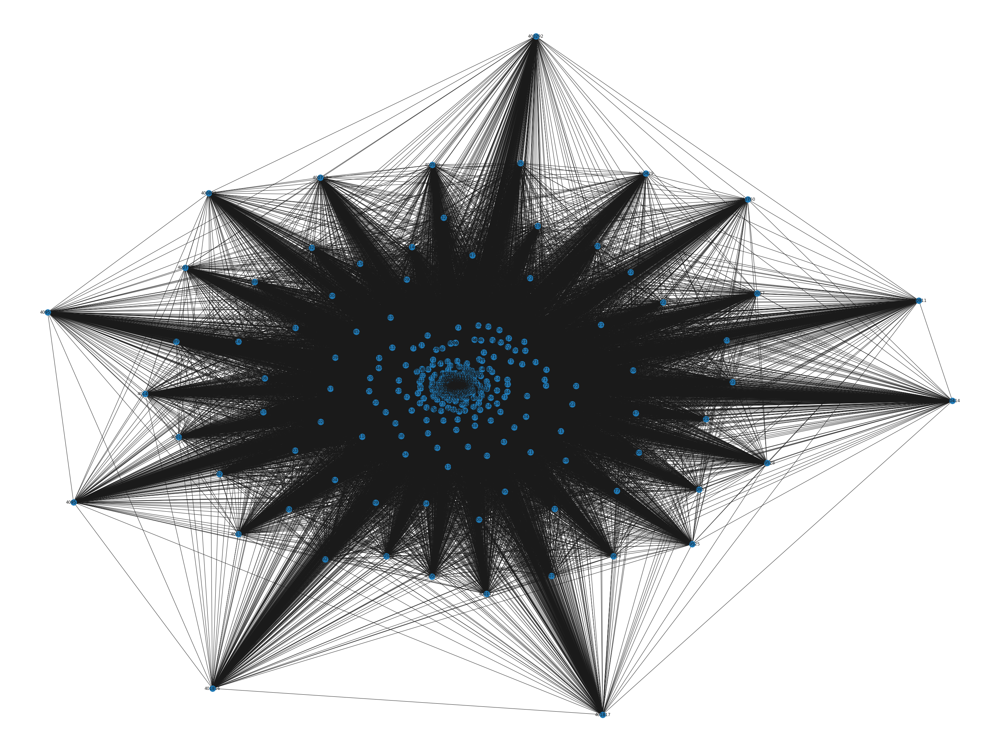

In [340]:
plt.figure(figsize = (40, 30))
G = nx.from_pandas_edgelist(df_1, source = 'sensor_1', target = 'sensor_2', edge_attr='weight')
nx.draw_kamada_kawai(G, with_labels=True)

In [341]:
df_w = df_1[(df_1['weight'] >= 0.8)]

In [342]:
df_w.head()

,sensor_1,sensor_2,lat1,lat2,lon1,lon2,distance,weight
4,400001,400045,37.364085,37.363402,-121.901149,-121.902233,0.122253,0.940704
19,400001,400122,37.364085,37.366140,-121.901149,-121.901132,0.228511,0.892030
56,400001,400394,37.364085,37.364382,-121.901149,-121.902692,0.140308,0.932250
68,400001,400479,37.364085,37.362439,-121.901149,-121.903211,0.258280,0.878851
126,400001,400922,37.364085,37.363644,-121.901149,-121.899535,0.150835,0.927356


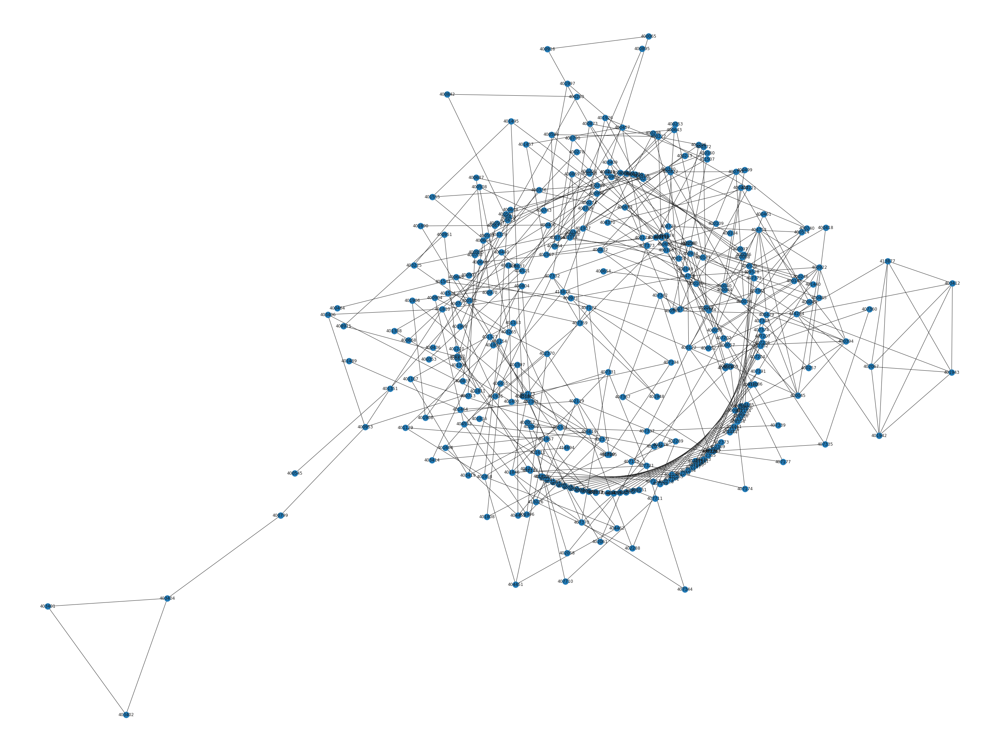

In [343]:
plt.figure(figsize = (40, 30))
G = nx.from_pandas_edgelist(df_w, source = 'sensor_1', target = 'sensor_2', edge_attr='weight')
nx.draw_kamada_kawai(G, with_labels=True)

b) Just the spatial distance of the sensor stations won’t explain the relation of the nodes accurately
enough for our analysis. Some sensors might be on the opposite side of a highway and measure
traffic in opposing directions, but are spatially very close. To better model this you can try:
• Using the distances from sensor road distances.csv. These are pre-computed distances
measured through the road network. You can either use this distance instead of the \longitudelatitude-plane" or use
w(i; j) := e−α·d(i;j)−βr(i;j) (2)
where r(i; j) is the distance through the road network and β is another hyperparameter.


In [82]:
data_distance=pd.read_csv('sensor_road_distances.csv')

In [83]:
data_distance=data_distance.set_axis(['index','sensor_1','sensor_2','road_distance'],axis=1)
#df=pair_sensor_com.set_axis(['sensor_1', 'sensor_2', 'lat1','lat2','lon1','lon2'], axis=1)

In [84]:
data_distance.head()

,index,sensor_1,sensor_2,road_distance
0,0,400017,400017,0.0
1,1,400030,400030,0.0
2,2,400030,400045,5108.4
3,3,400030,400065,7401.1
4,4,400030,400088,10961.1


In [85]:
# Similarity function for road distance
d=0
def weight(d):
    a=0.00009
    w=exp(-a*d)
    return w

In [86]:
data_distance['weight'] = data_distance.apply(lambda z: weight(z['road_distance']), axis=1)

In [87]:
data_distance.head()

,index,sensor_1,sensor_2,road_distance,weight
0,0,400017,400017,0.0,1.000000
1,1,400030,400030,0.0,1.000000
2,2,400030,400045,5108.4,0.631438
3,3,400030,400065,7401.1,0.513709
4,4,400030,400088,10961.1,0.372880


In [88]:
data_1 = data_distance[(data_distance['weight'] != 1)]

In [89]:
#without threshold on road distance data

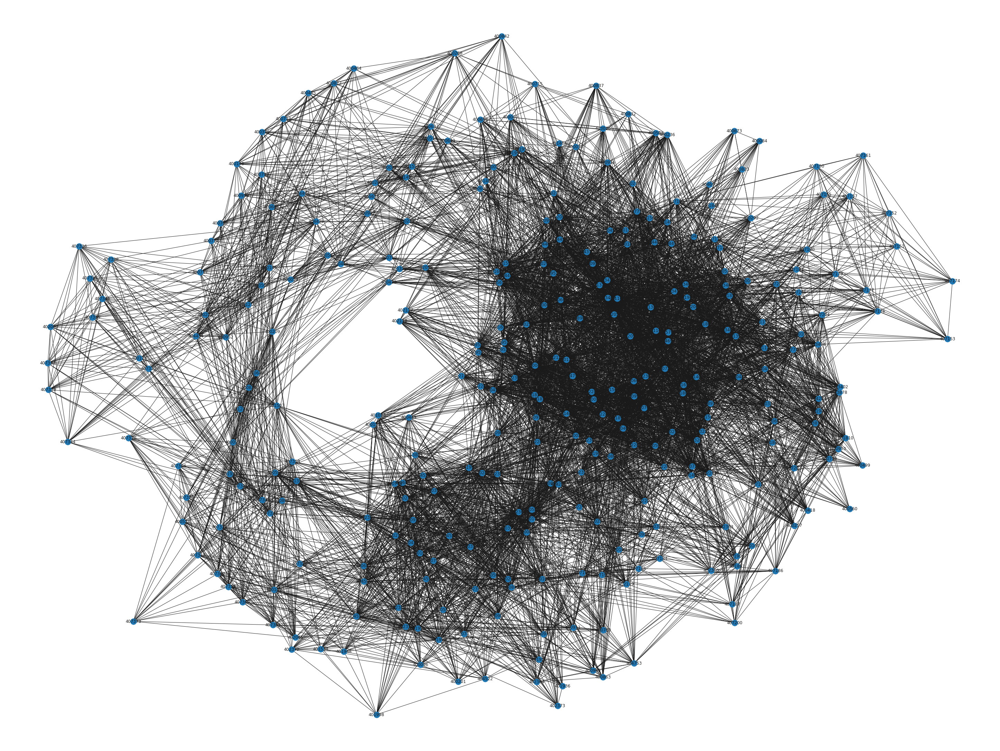

In [90]:
plt.figure(figsize = (40, 30))
G = nx.from_pandas_edgelist(data_1, source = 'sensor_1', target = 'sensor_2', edge_attr='weight')
nx.draw_kamada_kawai(G, with_labels=True)

In [91]:
data_2 = data_1[(data_1['weight'] >= 0.8)]

In [92]:
data_2.head()

,index,sensor_1,sensor_2,road_distance,weight
7,7,400030,400253,2475.9,0.800250
11,11,400030,400508,1744.0,0.854738
20,20,400030,401440,321.9,0.971445
34,34,400030,403225,1429.5,0.879277
35,35,400030,403265,1477.7,0.875471


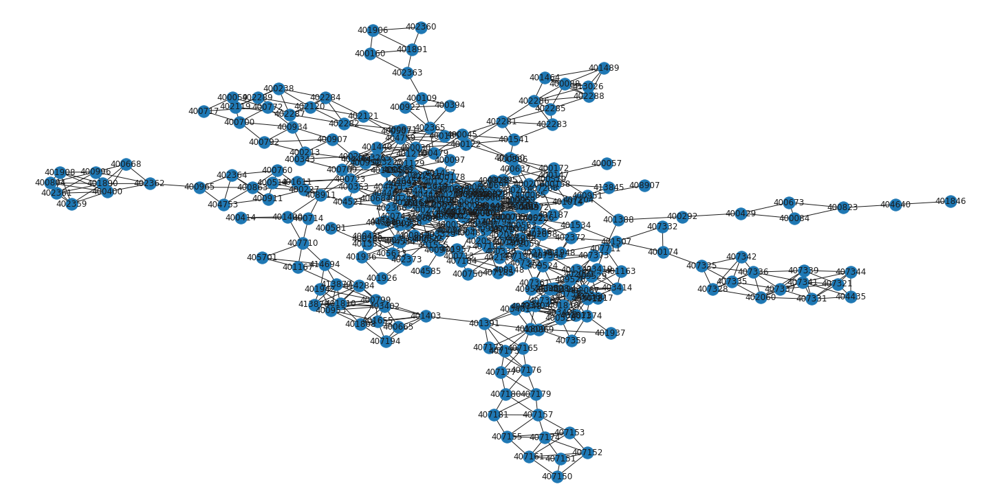

In [223]:
plt.figure(figsize = (20, 10))
G_d = nx.from_pandas_edgelist(data_2, source = 'sensor_1', target = 'sensor_2', edge_attr='weight')
nx.draw_kamada_kawai(G_d, with_labels=True)

Another idea for sparsification is to look at how much the traffic measurements of the stations are correlated to each other. For this you will need to calculate the correlation matrix C from a portion of the measurement data. Looking at only a single day is advisable, because traffic volume changes throughout the day but different weekdays have different traffic. Once you have calculated C, you can set a threshold for how much correlation you want on the edges and delete every edge that falls beneath that. Try some combinations of these and the method from a) or any other approach you think is feasible to use here and decide what graph you want to use for your further analysis.

In [161]:
df_3 = pd.read_csv("bay_traffic.csv")
df_3.head(2)

,Unnamed: 0,Date,400001,400017,400030,400040,400045,400052,400057,400059,...,409525,409526,409528,409529,413026,413845,413877,413878,414284,414694
0,0,2017-01-01 00:00:00,71.4,67.8,70.5,67.4,68.8,66.6,66.8,68.0,...,68.8,67.9,68.8,68.0,69.2,68.9,70.4,68.8,71.1,68.0
1,1,2017-01-01 00:30:00,71.3,67.6,70.1,67.2,68.5,66.8,65.7,67.8,...,68.5,67.3,68.5,67.7,68.5,68.9,70.0,68.5,70.8,67.5


In [162]:
df_3.drop('Unnamed: 0', axis=1, inplace=True)

In [164]:
df_3.head(2)

,Date,400001,400017,400030,400040,400045,400052,400057,400059,400065,...,409525,409526,409528,409529,413026,413845,413877,413878,414284,414694
0,2017-01-01 00:00:00,71.4,67.8,70.5,67.4,68.8,66.6,66.8,68.0,66.8,...,68.8,67.9,68.8,68.0,69.2,68.9,70.4,68.8,71.1,68.0
1,2017-01-01 00:30:00,71.3,67.6,70.1,67.2,68.5,66.8,65.7,67.8,66.7,...,68.5,67.3,68.5,67.7,68.5,68.9,70.0,68.5,70.8,67.5


A = df_3["Date"]
A
#G = nx.Graph((A[]))

plt.figure()
plt.title("Time_steps")
plt.plot(df_3["Date"])
plt.show()

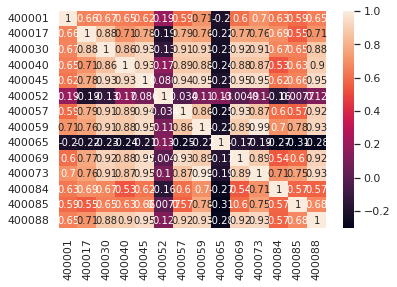

In [165]:
df_small = df_3.iloc[0:48, 0:15]
correlation_mat = df_small.corr()

sns.heatmap(correlation_mat, annot = True)
#sns.set(rc = {'figure.figsize':(15,8)})
plt.show()

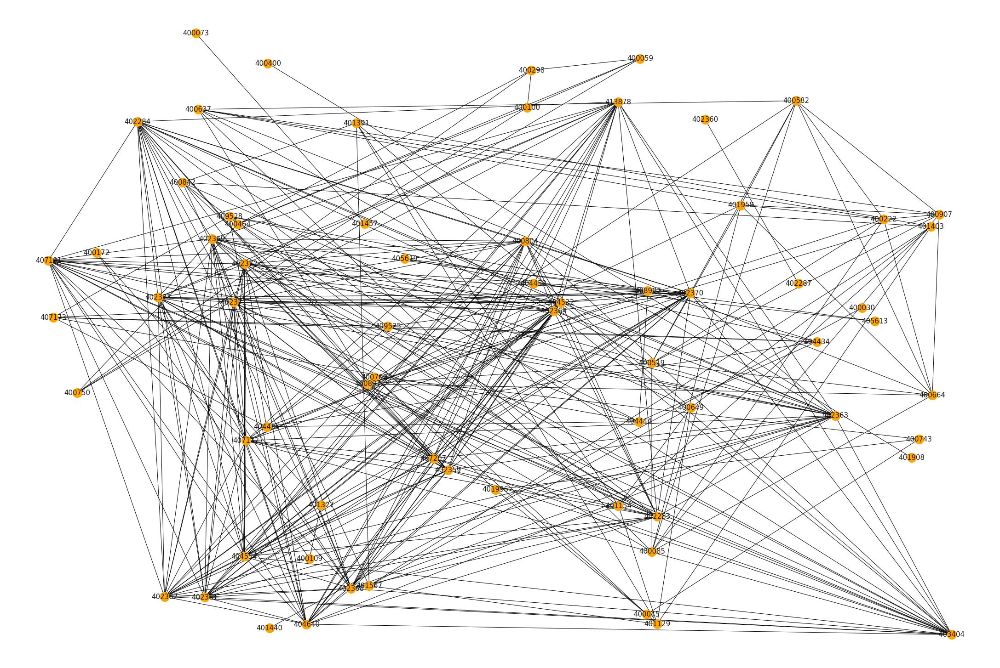

In [225]:
df_1day = df_3.iloc[0:48, 1:326]
cday1 = df_1day.corr()
# Transform it in a links data frame (3 columns only):
links = cday1.stack().reset_index()
links.columns = ['var1', 'var2', 'value']
 
# Keep only correlation over a threshold and remove self correlation (cor(A,A)=1)
links_filtered=links.loc[ (links['value'] > 0.9999) & (links['var1'] != links['var2']) ]
links_filtered 
# Build your graph
plt.figure(figsize = (30, 20))
G1=nx.from_pandas_edgelist(links_filtered, 'var1', 'var2')
 
# Plot the network:
nx.draw_random(G1, with_labels=True, node_color='orange', node_size=400, edge_color='black', linewidths=1, font_size=15)
#correlation_mat_day1


In [229]:
AG_TS_1 = nx.adjacency_matrix(G1)
AG_TS=np.matrix(AG_TS_1.todense())
AG_TS.shape

(68, 68)

df_1dayT=df_1day.T
df_1dayT.head()

#dfm = df_1day.melt('X_Axis', var_name='cols', value_name='vals')

g = sns.catplot(data=df_1dayT, kind='point')

In [233]:
sorted_pairs = corr_pairs.sort_values(kind="quicksort")

print(sorted_pairs)

407184  400760   -0.770444
400760  407184   -0.770444
400690  400715   -0.754136
400715  400690   -0.754136
407711  400996   -0.752461
                    ...   
402372  402361    1.000000
        402359    1.000000
        402284    1.000000
402373  402368    1.000000
414694  414694    1.000000
Length: 105625, dtype: float64


In [234]:
#Selecting correlation pairs (threshold greater than 0.8)
strong_pairs_1 = sorted_pairs[abs(sorted_pairs) > 0.8]
strong_pairs = strong_pairs_1[abs(sorted_pairs) != 1]
print(strong_pairs)

407180  402289    0.800025
402289  407180    0.800025
407165  400772    0.800032
400772  407165    0.800032
407179  400278    0.800086
                    ...   
405619  402287    0.998977
400030  401906    0.999572
401440  401906    0.999572
401906  400030    0.999572
        401440    0.999572
Length: 27632, dtype: float64


In [235]:
type(strong_pairs)

pandas.core.series.Series

In [236]:
#strong_pairs=strong_pairs[0].astype(str) #df['id'].astype(str)
strong_pairs
#strong_pairs[0].str.split(pat, n=2, expand=False)

407180  402289    0.800025
402289  407180    0.800025
407165  400772    0.800032
400772  407165    0.800032
407179  400278    0.800086
                    ...   
405619  402287    0.998977
400030  401906    0.999572
401440  401906    0.999572
401906  400030    0.999572
        401440    0.999572
Length: 27632, dtype: float64

c) The measurement of traffic quantity at a certain time can be viewed as a signal on the graph that
we constructed. In this graph, we cannot easily model time though. To also include this \dimension"
of the data, one can define a product graph of GT S with a graph representing time evolution, i.e.,
with a simple path graph GP with t nodes, where t is the number of considered time steps. Precisely,
this graph product is defined as
Gtime T S := AGT S ⊗ It + In ⊗ AGP (3)

where ⊗ denotes the Kronecker product of matrices2. In this graph, each node can be thought of as
corresponding to a particular sensor at a particular point in time. Write a function that constructs
a product graph for a user-specified time interval based on your graph GT S . Also write a function
that extracts traffic measurements for a given time range and maps it to a signal on the product
graph (e.g., represented as a vector)

https://www.machinelearningplus.com/time-series/time-series-analysis-python/

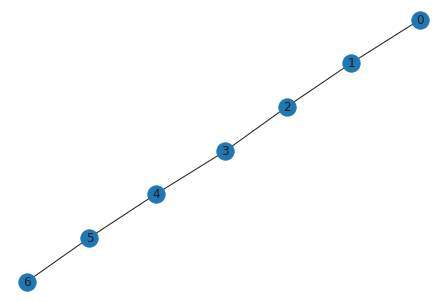

In [352]:
G_p = nx.path_graph(7)
nx.draw_kamada_kawai(G_p, with_labels=True)


In [353]:
for path in nx.all_simple_paths(G_p, source=0, target=6):
    print(path)

[0, 1, 2, 3, 4, 5, 6]


In [354]:
AG_p_1=nx.adjacency_matrix(G_p)

In [355]:
AG_p=np.matrix(AG_p_1.todense())

In [356]:
AG_p.shape
AG_TS.shape

(68, 68)

Gtime T S := AGT S ⊗ It + In ⊗ AGP

In [357]:
kron_AGTS=np.kron(AG_TS, np.eye(7))

kron_AGTS.shape

(476, 476)

In [358]:
kron_AG_p=np.kron(np.eye(68),AG_p)
kron_AG_p.shape

(476, 476)

kron_AGTS=Kroneckerproduct( AG_TS , np.eye(AG_p.shape[0]))

In [359]:
G_time_TS= kron_AGTS+kron_AG_p

In [360]:
G_time_TS.shape

(476, 476)

In [361]:
G_time_graph = nx.from_numpy_matrix(G_time_TS)

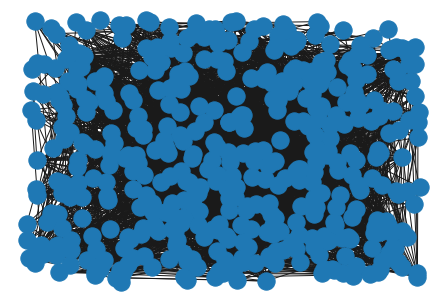

In [362]:
nx.draw_random(G_time_graph, with_labels=False)

Task 2 Understanding properties of traffic measurements using GSP
By interpreting traffic data as graph signals, we can study some of its properties. For example, we can
compare the frequency components of the different time intervals to see which times exhibit rather lowor rather high-frequent behavior and try to interpret this in terms of our intuitive understanding of
traffic behaves. It is also interesting to study whether this behavior is always the same or also depends
on other factors, like, e.g., time of the day/day of the week.

a) Write functions for computing the (inverse) discrete graph Fourier transform of graph signals on
GT S and Gtime T S .

In [263]:
#pos = nx.get_node_attributes(G_TS, "pos")
#cmap='coolwarm'
n = len(G1.nodes)
mu, W = np.linalg.eigh(AG_TS)
idx = mu.argsort()   
mu = mu[idx]
W = W[:,idx]
# Signal with equal contributions from all frequencies
s = W@np.ones((n,1))


In [264]:
print("Spectral interval: [" + str(mu.min()) + "," + str(mu.max()) +"]")

Spectral interval: [-1.0000000000000062,21.000000000000014]


In [265]:
def dgft(s):
    return W.T@s

def idgft(s_hat):
    return W@s_hat

(0.0, 2.0)

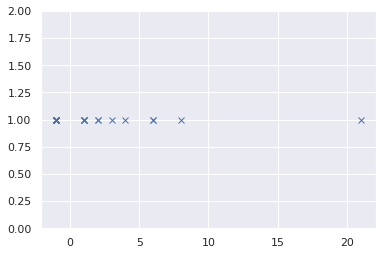

In [266]:
plt.plot(mu, abs(dgft(s)),'x')
plt.ylim(0,2)

In [267]:
s_hat = dgft(s)

(0.0, 2.0)

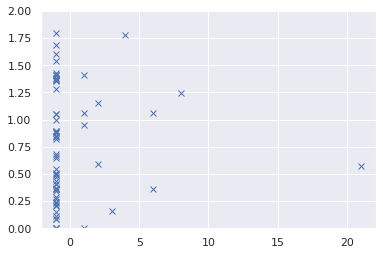

In [268]:
plt.plot(mu, abs(idgft(s_hat)),'x')
plt.ylim(0,2)

In [269]:
G_time_TS.shape

(476, 476)

In [274]:
n = len(G_time_graph.nodes)
mu, W = np.linalg.eigh(G_time_TS)
idx = mu.argsort()   
mu = mu[idx]
W = W[:,idx]
# Signal with equal contributions from all frequencies
s = W@np.ones((n,1))

In [275]:
print("Spectral interval: [" + str(mu.min()) + "," + str(mu.max()) +"]")

Spectral interval: [-2.847759065022579,22.84775906502257]


(0.0, 2.0)

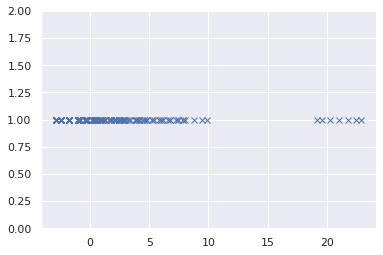

In [276]:
plt.plot(mu, abs(dgft(s)),'x')
plt.ylim(0,2)

In [277]:
s_hat = dgft(s)

(0.0, 2.0)

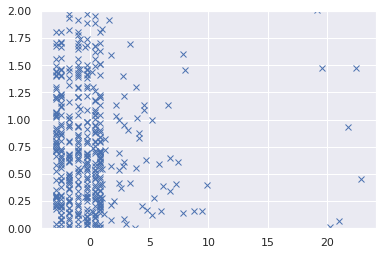

In [278]:
plt.plot(mu, abs(idgft(s_hat)),'x')
plt.ylim(0,2)